# Chapter 1

In [1]:
from PIL import Image
from pylab import *
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import os
import sys

## Import custom scripts

In [2]:
sys.path.insert(0, './src')
import imtools

## Import images

In [3]:
pil_im = Image.open('./images/empire.jpg')

Convert image to gray scale

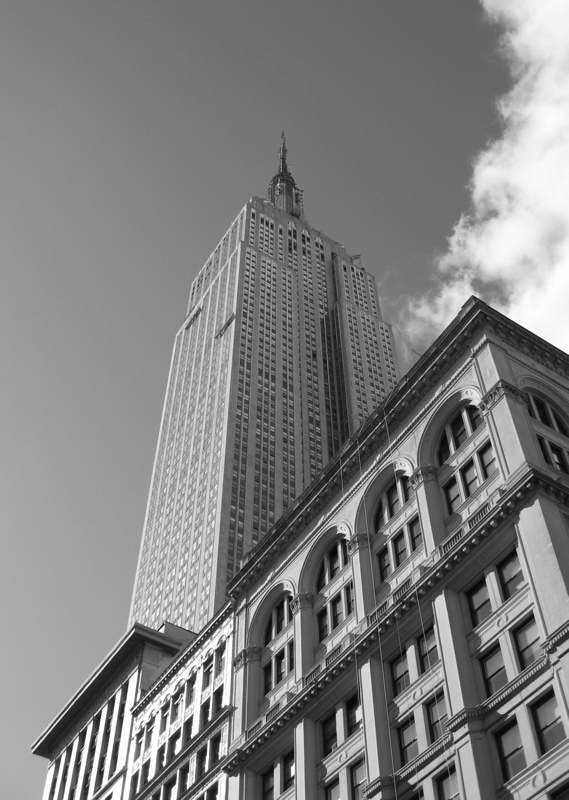

In [4]:
pil_im.convert('L')

## Function to paths for all specified image types from a given folder path

In [5]:
from imtools import get_imlist
path = os.path.join(os.getcwd(), 'images')
filelist = get_imlist(path)
filelist

['D:\\ML\\Python\\Computer Vision\\Computer_Vision_Note\\images\\AquaTermi_lowcontrast.jpg',
 'D:\\ML\\Python\\Computer Vision\\Computer_Vision_Note\\images\\empire.jpg']

## Script to save all files into jpg

In [6]:
for infile in filelist:
    outfile = os.path.splitext(infile)[0] + ".jpg"
    if infile != outfile:
        try:
            Image.open(infile).save(outfile)
        except IOError:
            print(f"cannot convert {infile}.")

## Create thumbnails for images

As oppose to resize, thumbnail retain maximum allowable defined thumbnail size while **preserving the aspect ratio** of the original image.

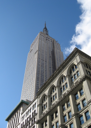

In [7]:
pil_im_thumbnails = pil_im.copy()
pil_im_thumbnails.thumbnail((128, 128))
pil_im_thumbnails

## Resize and Rotate image

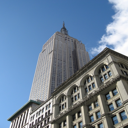

In [8]:
out = pil_im.resize((128, 128))
out

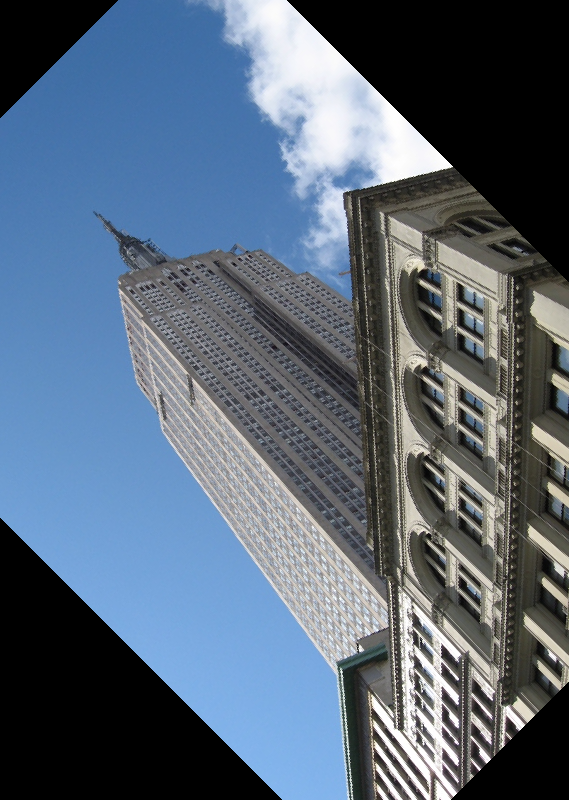

In [9]:
out = pil_im.rotate(45)
out

## Crop section from image

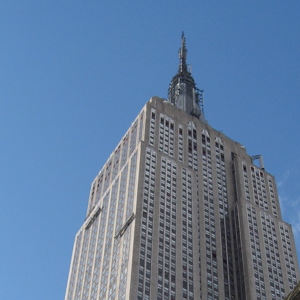

In [10]:
box = (100, 100, 400, 400)
region = pil_im.crop(box)
region

## Use Matplotlib to show images

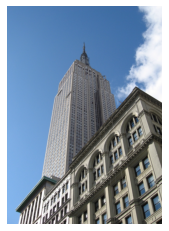

In [11]:
im = array(Image.open('.\images\empire.jpg')) 
im = plt.imread('.\images\empire.jpg')
imshow(im); plt.axis('off');

## Draw on image

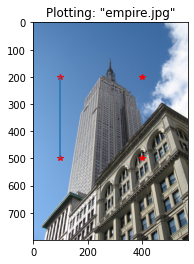

In [12]:
x = [100, 100, 400, 400]
y = [200, 500, 200, 500]

imshow(im)
plot(x, y, 'r*')
plot(x[:2], y[:2])
title('Plotting: "empire.jpg"')
show()

## Formatting commands for PyLab / Matplotlib

## Color

| **Color** ||
| --- | --- |
| 'b' | blue |
| 'g' | green |
| 'r' | red |
| 'c' | cyan |
| 'm' | magenta |
| 'y' | yellow |
| 'k' | black |
| 'w' | white |

## Line style

| **Line style** ||
| --- | --- |
| '-' | solid |
| '- -' | dashed |
| ':' | dotted |

## Marker style

| **Line style** ||
| --- | --- |
| '.' | point |
| 'o' | circle |
| 's' | square |
| '*' | star |
| '+' | plus |
| 'x' | x |

## Image Contour (single chanel)

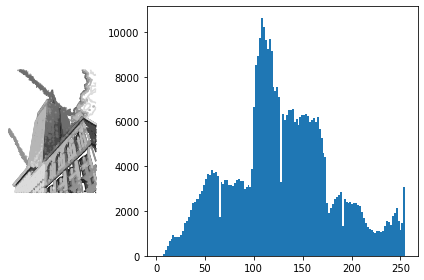

In [13]:
im = array(Image.open('./images/empire.jpg').convert('L'))
fig, (ax1, ax2) = plt.subplots(1, 2, gridspec_kw={'width_ratios': [1, 3]})
gray()
ax1.contour(im[::-1])
ax1.axis('equal')
ax1.axis('off')
ax2.hist(im.flatten(), 128)
fig.tight_layout()
show();

## Graylevel transforms

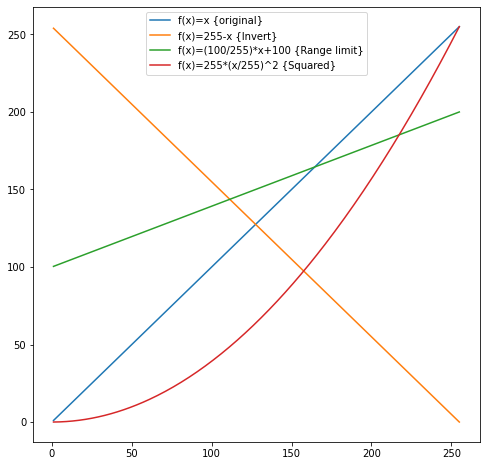

In [14]:
x = np.linspace(1, 255, 255)
y = x
y1 = 255 - y
y2 = (100./255.)*x + 100.
y3 = 255.*(x/255.)**2

figure(figsize=(8, 8))
plt.plot(x, y, label = "f(x)=x {original}")
plt.plot(x, y1, label = "f(x)=255-x {Invert}")
plt.plot(x, y2, label = "f(x)=(100/255)*x+100 {Range limit}")
plt.plot(x, y3, label = "f(x)=255*(x/255)^2 {Squared}")
plt.legend()
plt.show()

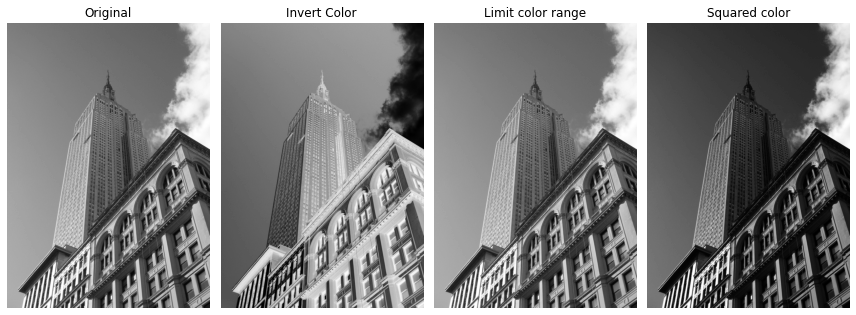

In [15]:
im = array(Image.open('./images/empire.jpg').convert('L'))
im2 = 255 - im #invert image color
im3 = (100.0/255) * im + 100 #limt image to 100 - 200
im4 = 255.0 * (im/255.0)**2 #square color

fig, axs = plt.subplots(1, 4,figsize=(12,8))
gray()
axs[0].imshow(im)
axs[0].set_title('Original')
axs[0].axis('off')
axs[1].imshow(im2)
axs[1].set_title('Invert Color')
axs[1].axis('off')
axs[2].imshow(im3)
axs[2].set_title('Limit color range')
axs[2].axis('off')
axs[3].imshow(im4)
axs[3].set_title('Squared color')
axs[3].axis('off')
fig.tight_layout()
show();

## Histogram equalization

Histogram equalization on a graylevel transform flattens the graylevel histogram of an image so that all intensities are as equally common as possible. This is a good way to normalize image intensity before further processing and also a way to increase image contrast.

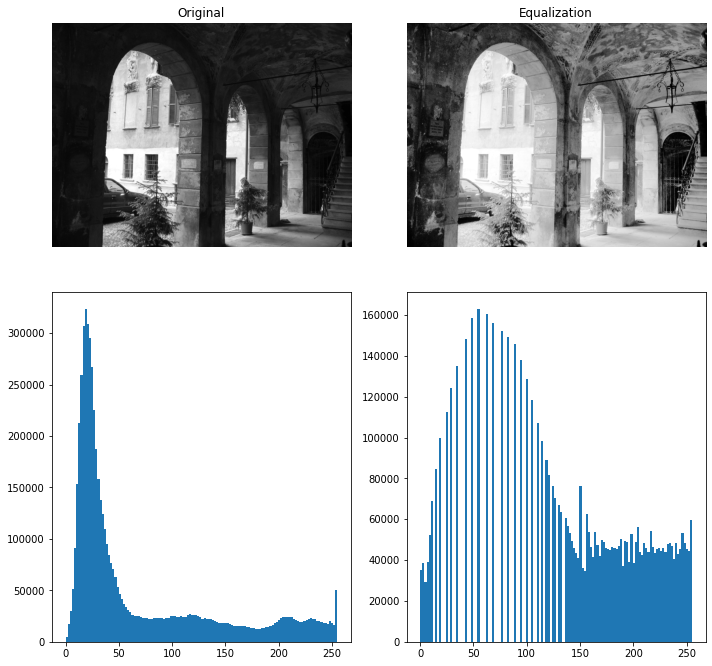

In [16]:
im = array(Image.open('./images/AquaTermi_lowcontrast.jpg').convert('L'))
im2, cdf = imtools.histeq(im)

fig, axs = plt.subplots(2, 2, figsize=(10, 10))
gray()
axs[0, 0].imshow(im)
axs[0, 0].set_title('Original')
axs[0, 0].axis('off')
axs[0, 1].imshow(im2)
axs[0, 1].set_title('Equalization')
axs[0, 1].axis('off')
axs[1, 0].hist(im.flatten(), 128)
axs[1, 1].hist(im2.flatten(), 128)
fig.tight_layout()
show();

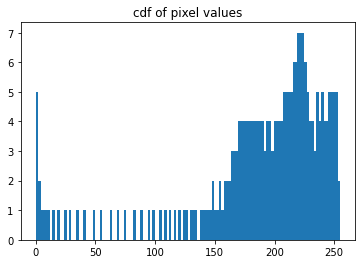

In [17]:
plt.hist(cdf, 128)
plt.title("cdf of pixel values")
show();

## Averaging Images

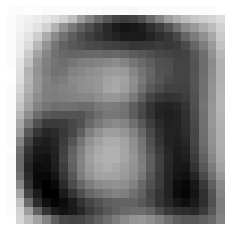

In [18]:
from imtools import get_imlist
from imtools import compute_average

path = "images/a_thumbs"
imlist = get_imlist(path, extension="jpg")

imshow(compute_average(imlist))
plt.axis('off');

## PCA

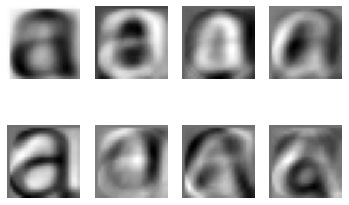

In [19]:
import pca
im = array(Image.open(imlist[0]))
m,n = im.shape[0:2]
imnbr = len(imlist)

immatrix = array([array(Image.open(im)).flatten() for im in imlist],'f')

V, S, immean = pca.pca(immatrix)

figure()
gray()
subplot(2, 4, 1)
imshow(immean.reshape(m, n))
plt.axis('off')

for i in range(7):
    subplot(2, 4, i+2)
    imshow(V[i].reshape(m, n))
    plt.axis('off')

show()

Top left: mean image, and the first seven modes - the directions with most variations (of all the font images).

## To save object in pickle

In [20]:
import pickle
with open('font_pca_modes.pkl', 'wb') as f:
    pickle.dump(immean,f)
    pickle.dump(V,f)

## To load object from pickle

In [21]:
with open('font_pca_modes.pkl', 'rb') as f:
    immean = pickle.load(f)
    V = pickle.load(f)

## Gaussian blur using scipy filters (changing standard deviation)

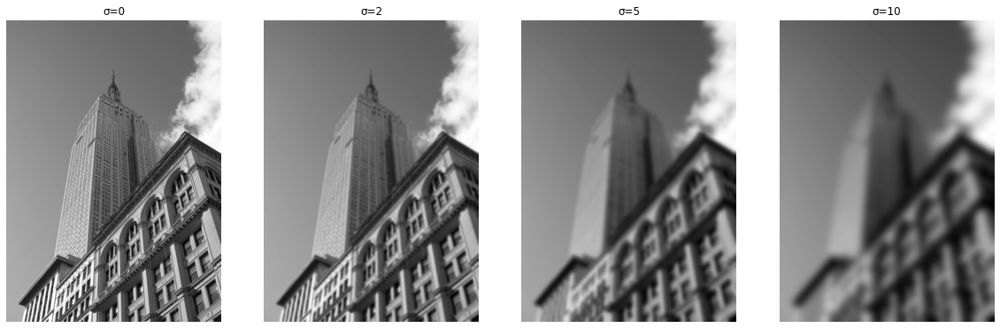

In [22]:
from scipy.ndimage import filters

im = array(Image.open('images/empire.jpg').convert('L'))

s = [0, 2, 5, 10]
figure(figsize=[20, 10])
gray()
for i in range(4):
    subplot(1, 4, i+1)
    im2 = filters.gaussian_filter(im, s[i])
    imshow(im2)
    plt.title(f'σ={s[i]}')
    plt.axis('off')

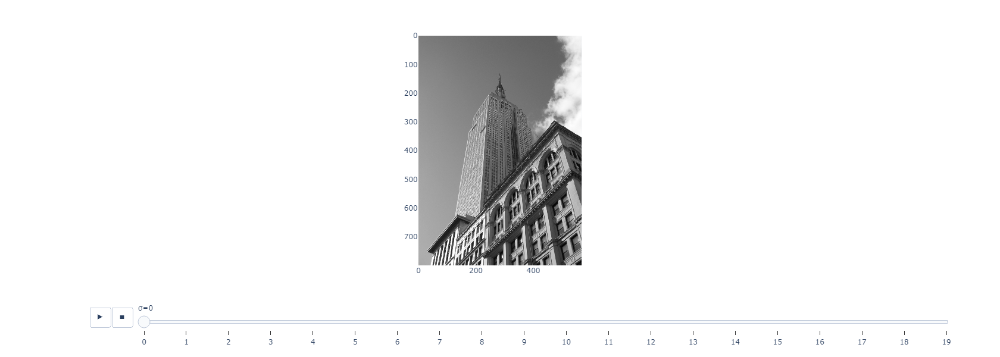

In [23]:
im = array(Image.open('images/empire.jpg').convert('L'))
img = zeros((20, im.shape[0], im.shape[1]))

for s in range(20):
    img[s] = filters.gaussian_filter(im, s)
    

fig = px.imshow(img, animation_frame=0, binary_string=True, labels=dict(animation_frame="σ"), width=600, height=600)
fig.show()

## Image Derivatives (Gradient) - using sobel filters

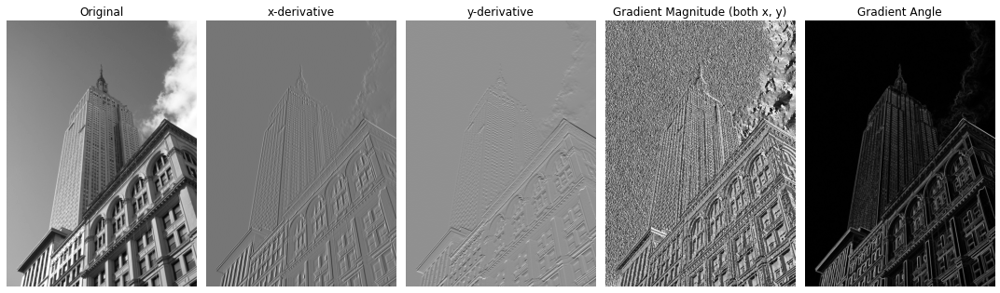

In [24]:
im = array(Image.open('images/empire.jpg').convert('L'))
imx = zeros(im.shape)
filters.sobel(im, 1, imx)

imy = zeros(im.shape)
filters.sobel(im, 0, imy)
α = arctan2(imx, imy)
magnitude = sqrt(imx**2+imy**2)

img = {'ori':im, 'imx':imx, 'imy':imy, 'α':α, 'magnitude':magnitude}

title = ['Original','x-derivative','y-derivative','Gradient Magnitude (both x, y)','Gradient Angle']
fig, axs = plt.subplots(1, 5, figsize=(15, 10))
gray()
for i in range(5):
    keys=list(img)
    axs[i].imshow(img[keys[i]])
    axs[i].set_title(title[i])
    axs[i].axis('off')
fig.tight_layout()
show();

In the two derivative images, positive derivatives are shown with bright pixels and negative derivatives are dark. Gray areas have values close to zero.

## Image Derivatives (Gradient) - using gaussian

Less sensitive to image resolution and more robust to noise.

In [25]:
def gaussian_derivatives(im, s=1):
    imx = zeros(im.shape)
    filters.gaussian_filter(im, (s, s), (0, 1), imx)

    imy = zeros(im.shape)
    filters.gaussian_filter(im, (s, s), (1, 0), imy)

    α = arctan2(imx, imy)
    magnitude = sqrt(imx**2+imy**2)
    
    return {'ori':im, 'imx':imx, 'imy':imy, 'α':α, 'magnitude':magnitude}

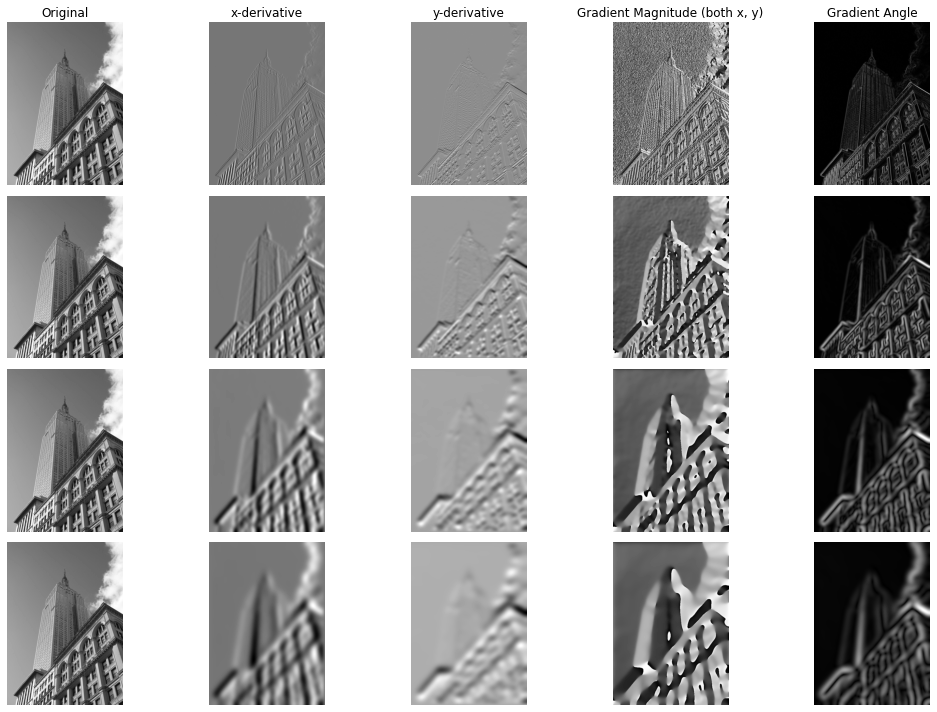

In [26]:
im = array(Image.open('images/empire.jpg').convert('L'))

s = [1, 5, 10, 15]
title = ['Original','x-derivative','y-derivative','Gradient Magnitude (both x, y)','Gradient Angle']

fig, axs = subplots(4, 5, figsize=(15, 10))
gray()
k = 0
for i in s:
    gd = gaussian_derivatives(im, i)
    keys = list(gd)
    
    for j in range(5):
        axs[k,j].imshow(gd[keys[j]])
        if k == 0:
            axs[k,j].set_title(title[j])
        axs[k,j].axis('off')
    k+=1

fig.tight_layout()
show();

In [27]:
%%script false --no-raise-error
im = array(Image.open('images/empire.jpg').convert('L'))
img = zeros((5, 2, im.shape[0], im.shape[1]))
i = 0
for s in np.linspace(0, 10, 5):
    imx = zeros(im.shape)
    filters.gaussian_filter(im, (s, s), (0, 1), imx)
    imy = zeros(im.shape)
    filters.gaussian_filter(im, (s, s), (1, 0), imy)

    img[i, 0] = sqrt(imx**2+imy**2)
    img[i, 1] = arctan2(imx, imy)
    i+=1

fig = px.imshow(img, animation_frame=0, facet_col=1, color_continuous_scale='gray', labels=dict(animation_frame="σ"), width=400, height=400, contrast_rescaling="minmax")
for i, label in enumerate(['Gradient Magnitude', 'Gradient Angle']):
    fig.layout.annotations[i]['text'] = label

#pyo.plot(fig, filename="figures/ch1_2.html")
fig.show()

## Morphology - Counting Objects

Number of objects: 45


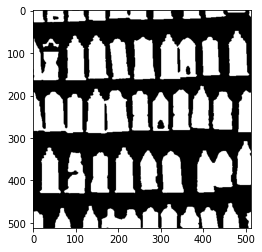

In [28]:
from scipy.ndimage import measurements,morphology

im = array(Image.open('images/houses.png').convert('L'))
im = 1*(im<128) #convert to binary image
labels, nbr_objects = measurements.label(im)
imshow(im)
print(f"Number of objects: {nbr_objects}")

## Morphology - opening to separate objects better

**binary_opening** specifies the structuring element,an array that indicates what neighbors to use when centered around a pixel. In this case, we used 9 pixels (4 above, the pixel itself, and 4 below) in the y direction and 5 in the x direction. There is a function named **binary_closing()** that does the reverse (joining objects). 

Number of objects: 48


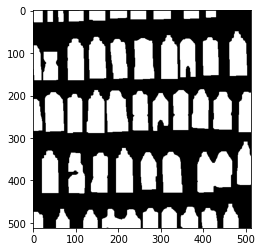

In [29]:
im = array(Image.open('images/houses.png').convert('L'))
im = 1*(im<128) #convert to binary image
im_open = morphology.binary_opening(im, ones((9,5)),iterations=2)
labels_open, nbr_objects_open = measurements.label(im_open)
imshow(im_open)
print(f"Number of objects: {nbr_objects_open}")

Number of objects: 27


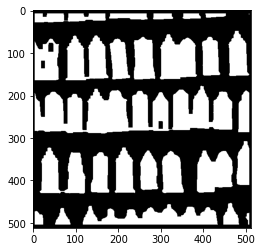

In [30]:
im = array(Image.open('images/houses.png').convert('L'))
im = 1*(im<128) #convert to binary image
im_open = morphology.binary_closing(im, ones((9,5)),iterations=2)
labels_open, nbr_objects_open = measurements.label(im_open)
imshow(im_open)
print(f"Number of objects: {nbr_objects_open}")

## Image De-Noising - Rudin-Osher-Fatemi de-noising model (ROF)

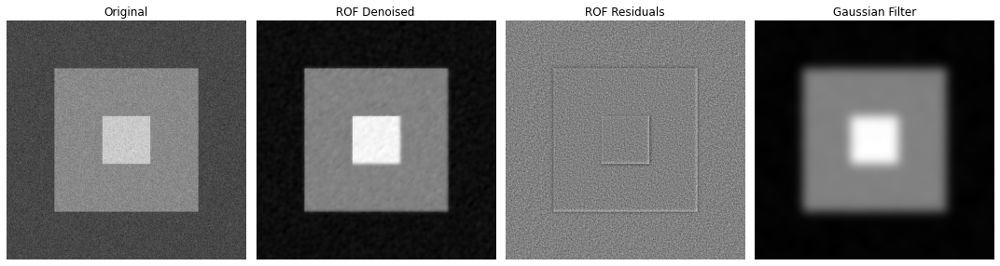

In [31]:
import rof
from numpy import random
# create synthetic image with noise
im = zeros((500,500))
im[100:400, 100:400] = 128
im[200:300, 200:300] = 255
im = im + 30*random.standard_normal((500,500))
U, T = rof.denoise(im,im)
G = filters.gaussian_filter(im,10)

fig, axs = plt.subplots(1, 4, figsize=(15, 10))
gray()
axs[0].imshow(im)
axs[0].set_title('Original')
axs[0].axis('off')
axs[1].imshow(U)
axs[1].set_title('ROF Denoised')
axs[1].axis('off')
axs[2].imshow(T)
axs[2].set_title('ROF Residuals')
axs[2].axis('off')
axs[3].imshow(G)
axs[3].set_title('Gaussian Filter')
axs[3].axis('off')
fig.tight_layout()
show();

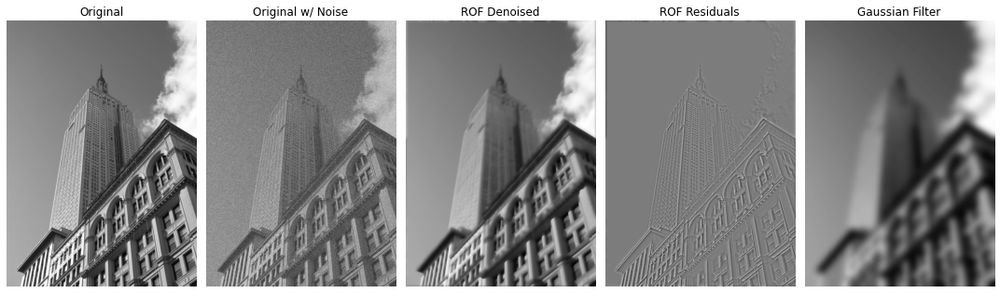

In [32]:
im = array(Image.open('images/empire.jpg').convert('L'))
im_noise = im + 30*random.standard_normal((im.shape[0],im.shape[1]))

U, T = rof.denoise(im,im)
G = filters.gaussian_filter(im,10)

fig, axs = plt.subplots(1, 5, figsize=(15, 10))
gray()
axs[0].imshow(im)
axs[0].set_title('Original')
axs[0].axis('off')
axs[1].imshow(im_noise)
axs[1].set_title('Original w/ Noise')
axs[1].axis('off')
axs[2].imshow(U)
axs[2].set_title('ROF Denoised')
axs[2].axis('off')
axs[3].imshow(T)
axs[3].set_title('ROF Residuals')
axs[3].axis('off')
axs[4].imshow(G)
axs[4].set_title('Gaussian Filter')
axs[4].axis('off')
fig.tight_layout()
show();

In [33]:
!ls -lh

total 16M
-rw-r--r-- 1 Microphone 197121  14M Feb 13 00:44 Chapter_1.ipynb
-rw-r--r-- 1 Microphone 197121 1.5M Feb 13 00:44 font_pca_modes.pkl
drwxr-xr-x 1 Microphone 197121    0 Feb 12 23:16 images
-rw-r--r-- 1 Microphone 197121  276 Feb 12 23:55 README.md
drwxr-xr-x 1 Microphone 197121    0 Feb 12 23:32 src
